# Install library for the first time

In [1]:
#pip install folium

# Import necessary library

In [2]:
import pytest
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import missingno as msno
import plotly.express as px
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
#df.to_csv('preprocessed_data.csv', index=False)

In [4]:
import pandas as pd

# Load the preprocessed data from the CSV file
df = pd.read_csv('preprocessed_data.csv')


In [5]:
df.head()

,TYPE,HUNDRED_BLOCK,NEIGHBOURHOOD,Latitude,Longitude,DATETIME
0,other theft,9xx terminal ave,strathcona,49.269802,-123.083763,2003-05-12 16:15:00
1,other theft,9xx terminal ave,strathcona,49.269802,-123.083763,2003-05-07 15:20:00
2,other theft,9xx terminal ave,strathcona,49.269802,-123.083763,2003-04-23 16:40:00
3,other theft,9xx terminal ave,strathcona,49.269802,-123.083763,2003-04-20 11:15:00
4,other theft,9xx terminal ave,strathcona,49.269802,-123.083763,2003-04-12 17:45:00


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 470938 entries, 0 to 470937
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TYPE           470938 non-null  object 
 1   HUNDRED_BLOCK  470938 non-null  object 
 2   NEIGHBOURHOOD  470938 non-null  object 
 3   Latitude       470938 non-null  float64
 4   Longitude      470938 non-null  float64
 5   DATETIME       470938 non-null  object 
dtypes: float64(2), object(4)
memory usage: 21.6+ MB


In [7]:
# Label encoding
df['TYPE'] = df['TYPE'].astype('category').cat.codes
df['HUNDRED_BLOCK'] = df['HUNDRED_BLOCK'].astype('category').cat.codes
df['NEIGHBOURHOOD'] = df['NEIGHBOURHOOD'].astype('category').cat.codes

In [8]:
df.head(3)

,TYPE,HUNDRED_BLOCK,NEIGHBOURHOOD,Latitude,Longitude,DATETIME
0,3,14169,19,49.269802,-123.083763,2003-05-12 16:15:00
1,3,14169,19,49.269802,-123.083763,2003-05-07 15:20:00
2,3,14169,19,49.269802,-123.083763,2003-04-23 16:40:00


# Sample Data

In [9]:
# Due to the dataset is very large, we use sample data from each types of crime happened
sample_data = df.groupby('TYPE', group_keys=False).apply(lambda x: x.sample(min(len(x), 1500)))

In [10]:
sample_data.shape

(12252, 6)

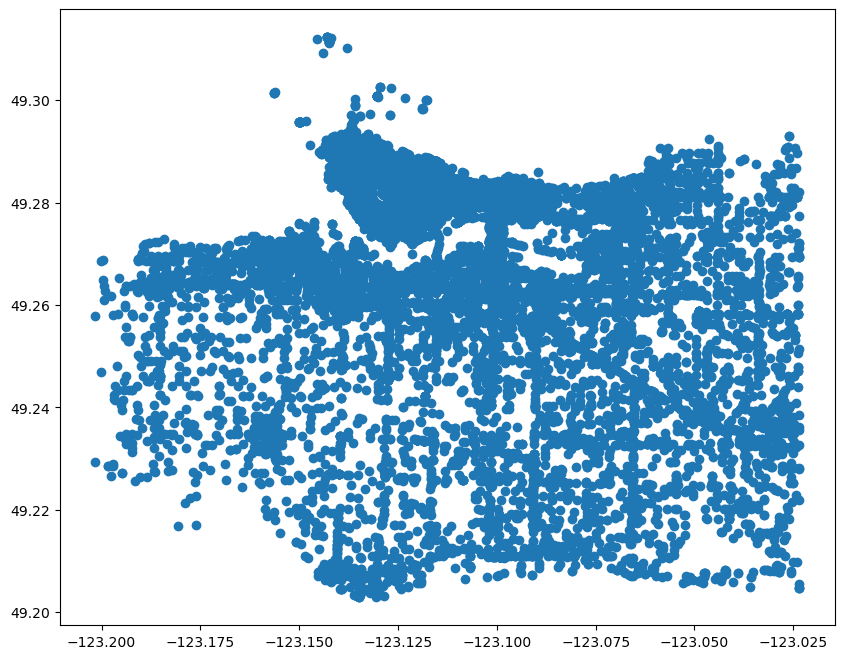

In [11]:
plt.figure(figsize=(10, 8))
plt.scatter(sample_data.Longitude, sample_data.Latitude)

In [12]:
sample_data.head(3)

,TYPE,HUNDRED_BLOCK,NEIGHBOURHOOD,Latitude,Longitude,DATETIME
451411,0,5587,5,49.284982,-123.044077,2016-09-12 17:34:00
266018,0,9173,1,49.283618,-123.103278,2010-12-11 12:00:00
193935,0,12329,20,49.218286,-123.077118,2007-05-22 09:07:00


# Modelling with PCA

In [13]:
from sklearn.preprocessing import StandardScaler

# Selecting numerical features for clustering
X_sample1 = sample_data[['Longitude', 'Latitude']]
X_sample2 = sample_data[['TYPE', 'HUNDRED_BLOCK']]

# Convert categorical data to dummy variables
X_scaled1 = pd.get_dummies(X_sample1)
X_scaled2 = pd.get_dummies(X_sample2)

# Standardize the features
scaler = StandardScaler()
X_scaled1 = scaler.fit_transform(X_scaled1)
X_scaled2 = scaler.fit_transform(X_scaled2)
print("X_scaled1: \n", X_scaled1)
print("\nX_scaled2: \n", X_scaled2)

X_scaled1: 
 [[ 1.63860482  1.01271369]
 [ 0.04573423  0.9522359 ]
 [ 0.74959475 -1.94411192]
 ...
 [-0.44201309  0.80624545]
 [-1.47576231  0.30968049]
 [ 1.55872304 -0.00606733]]

X_scaled2: 
 [[-1.46774873 -0.47905056]
 [-1.46774873  0.13631395]
 [-1.46774873  0.67788963]
 ...
 [ 1.71055763  1.89128685]
 [ 1.71055763  1.06279275]
 [ 1.71055763  1.477383  ]]


In [14]:
print("X_scaled1 shape: ", X_scaled1.shape)
print("X_scaled2 shape: ", X_scaled2.shape)

X_scaled1 shape:  (12252, 2)
X_scaled2 shape:  (12252, 2)


In [15]:
# Reducing the dimensions of the data 
pca = PCA(n_components=2)
X_principal1 = pca.fit_transform(X_scaled1) 
X_principal2 = pca.fit_transform(X_scaled2) 

df_X_principal1 = pd.DataFrame(X_principal1)
df_X_principal1.columns = ['P1', 'P2'] 
df_X_principal2 = pd.DataFrame(X_principal2)
df_X_principal2.columns = ['P1', 'P2'] 

In [16]:
df_X_principal1.head(3)

,P1,P2
0,0.442572,-1.874765
1,-0.640993,-0.705671
2,1.904738,0.844651


In [17]:
df_X_principal2.head(3)

,P1,P2
0,-1.376595,0.699115
1,-0.941467,1.134244
2,-0.558515,1.517195


# K-Means Clustering

### clustering for X_scaled1

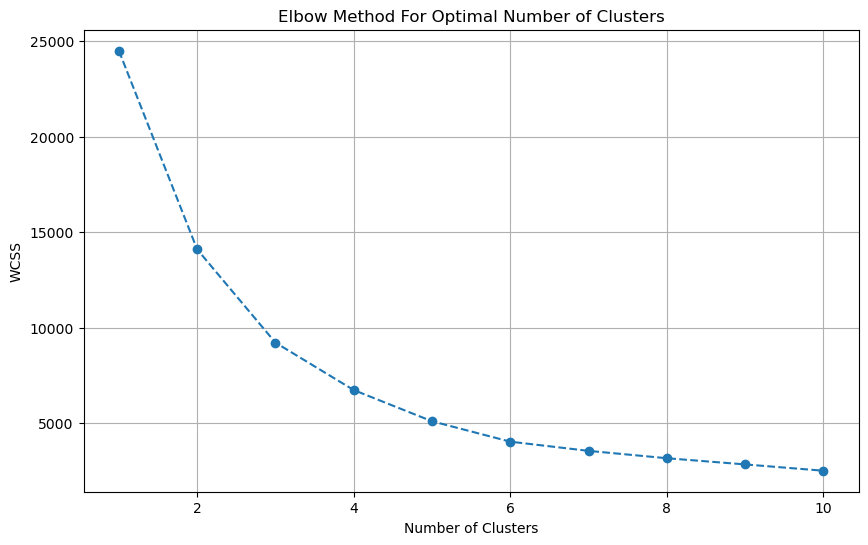

In [18]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine the range of cluster numbers to test
max_clusters = 10

# Calculate WCSS for each number of clusters
wcss = []
for i in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    kmeans.fit(X_scaled1)
    wcss.append(kmeans.inertia_)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters+1), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' 

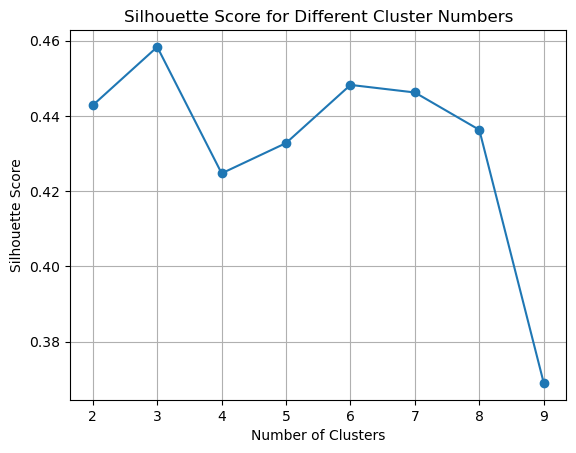

Best number of clusters: 3


In [19]:
silhouette_scores = []
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels1 = kmeans.fit_predict(X_scaled1)
    silhouette_scores.append(silhouette_score(X_scaled1, cluster_labels1))
    
# Plot the silhouette scores
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score for Different Cluster Numbers')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# print the best number cluster
best_n_clusters = silhouette_scores.index(max(silhouette_scores)) + 2  # Add 2 because range starts from 2
print("Best number of clusters:", best_n_clusters)

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\AppData\Local\Temp\ipykernel_24024\275950388.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_sample1['Cluster'] = km_cluster_labels1


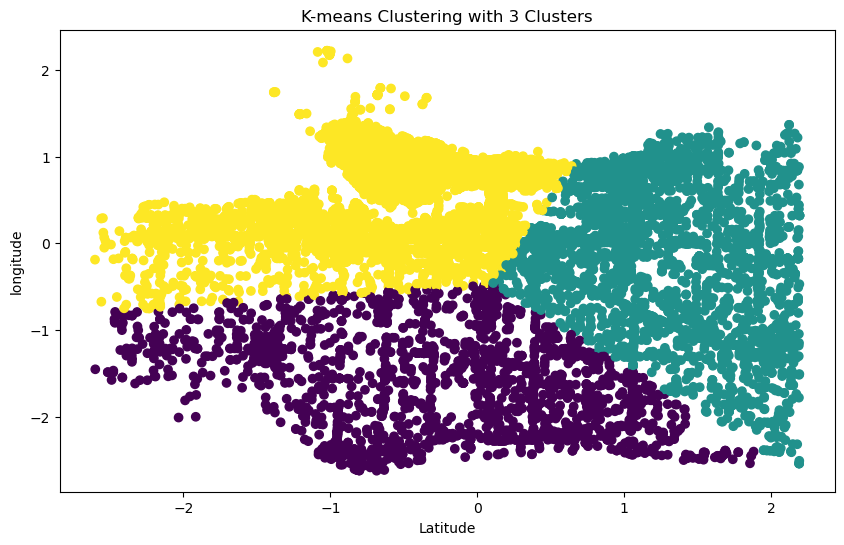

In [20]:
# Apply k-means clustering with chosen number of clusters
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
km_cluster_labels1 = kmeans.fit_predict(X_scaled1)

# Add cluster labels to the original dataset
X_sample1['Cluster'] = km_cluster_labels1

#visualize clusters with pairs of features using scatter plots
plt.figure(figsize=(10, 6))
plt.scatter(X_scaled1[:, 0], X_scaled1[:, 1], c=X_sample1['Cluster'], cmap='viridis')
plt.title('K-means Clustering with 3 Clusters')
plt.xlabel('Latitude')
plt.ylabel('longitude')
plt.show()


C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\AppData\Local\Temp\ipykernel_24024\1399643044.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_sample1['Cluster'] = kmeans.fit_predict(X_scaled1)


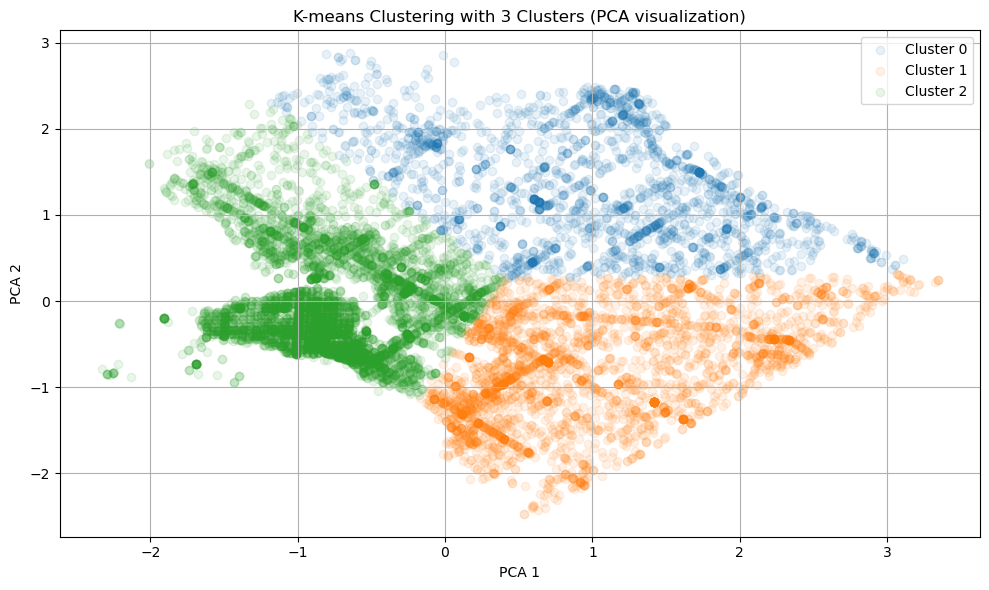

In [21]:
# Cluster the data into 3 clusters
kmeans = KMeans(n_clusters=best_n_clusters, random_state=42)
X_sample1['Cluster'] = kmeans.fit_predict(X_scaled1)

# Plot the clusters
plt.figure(figsize=(10, 6))
for cluster_num in range(best_n_clusters):
    subset = X_principal1[X_sample1['Cluster'] == cluster_num]
    plt.scatter(subset[:, 0], subset[:, 1], label=f"Cluster {cluster_num}", alpha=0.1)

plt.title('K-means Clustering with 3 Clusters (PCA visualization)')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

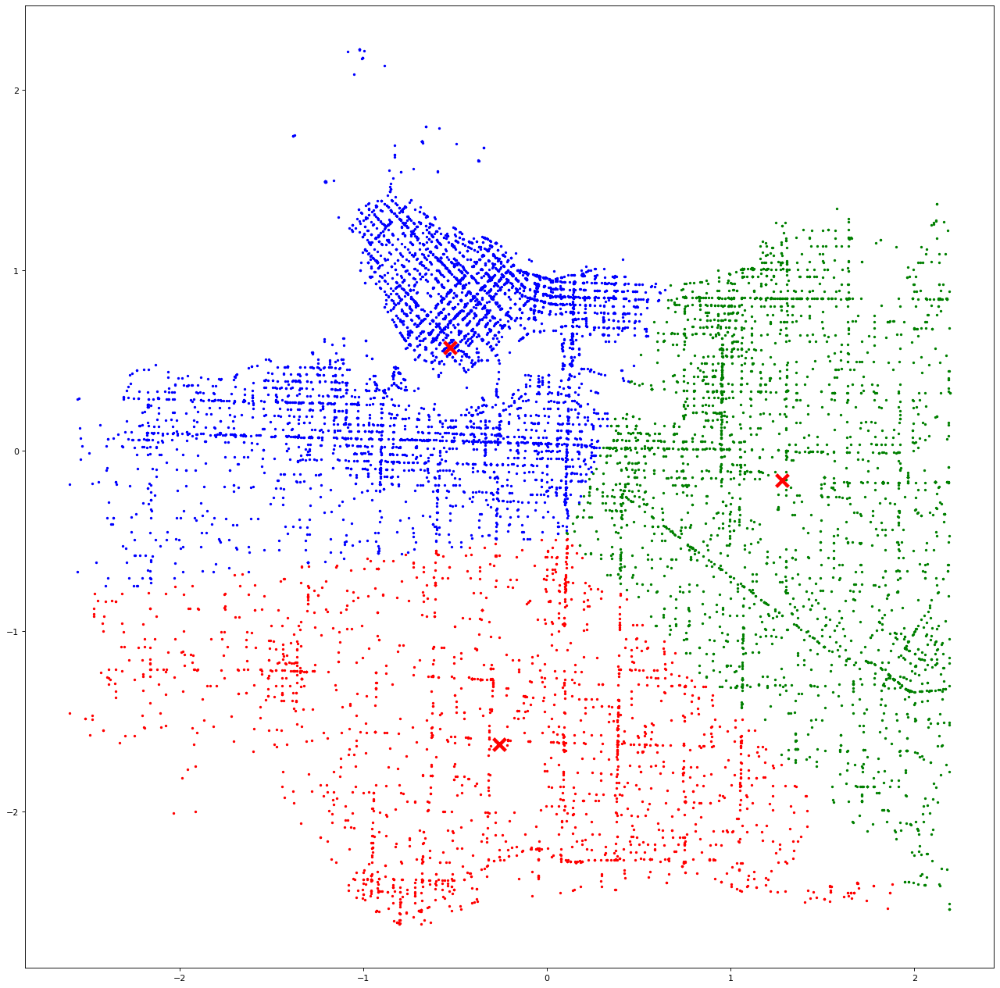

In [22]:
from sklearn.cluster import KMeans

plt.figure(figsize=(20, 20), dpi=80)

km_centers = kmeans.cluster_centers_

group = kmeans.predict(X_scaled1)

g0 = X_scaled1[group == 0]
g1 = X_scaled1[group == 1]
g2 = X_scaled1[group == 2]
g3 = X_scaled1[group == 3]

plt.scatter(x=g0[:, 0], y = g0[:,1], color = "red", s=4)
plt.scatter(x=g1[:, 0], y = g1[:,1], color = "green", s=4)
plt.scatter(x=g2[:, 0], y = g2[:,1], color = "blue", s=4)
plt.scatter(x=g3[:, 0], y = g3[:,1], color = "purple", s=4)
plt.scatter(x=km_centers[:, 0], y = km_centers[:, 1], color="red", s=200, marker='x', linewidths=4)
plt.show()

### clustering for X_scaled2

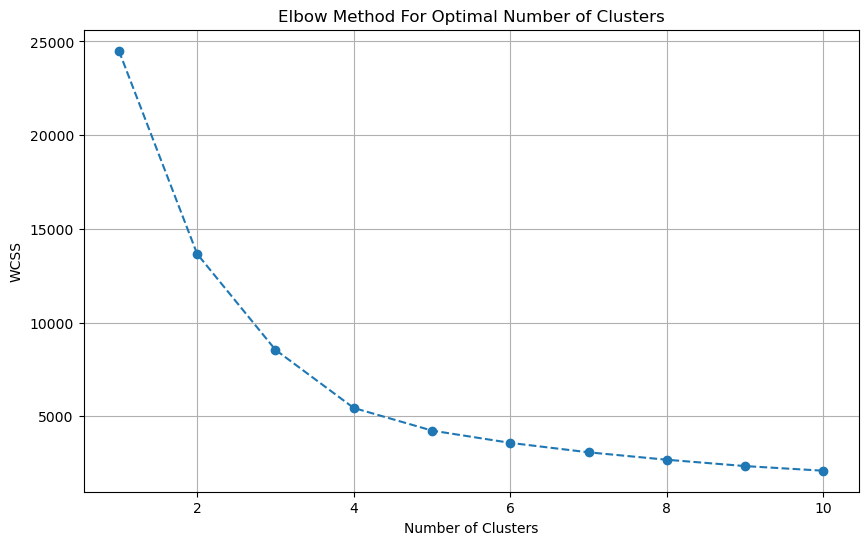

In [23]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine the range of cluster numbers to test
max_clusters = 10

# Calculate WCSS for each number of clusters
wcss = []
for i in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    kmeans.fit(X_scaled2)
    wcss.append(kmeans.inertia_)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters+1), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' 

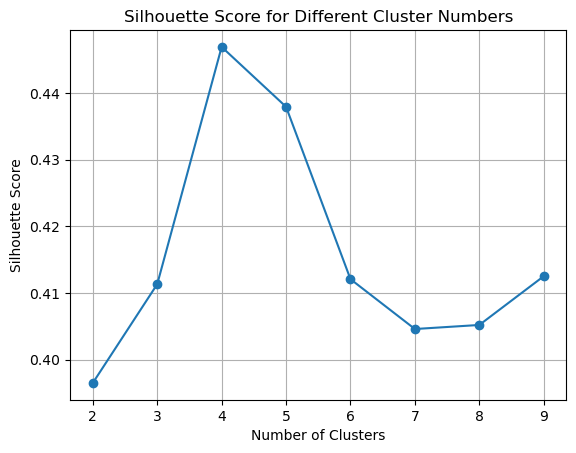

Best number of clusters: 4


In [24]:
silhouette_scores = []
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels2 = kmeans.fit_predict(X_scaled2)
    silhouette_scores.append(silhouette_score(X_scaled2, cluster_labels2))
    
# Plot the silhouette scores
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score for Different Cluster Numbers')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# print the best number cluster
best_n_clusters = silhouette_scores.index(max(silhouette_scores)) + 2  # Add 2 because range starts from 2
print("Best number of clusters:", best_n_clusters)

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\AppData\Local\Temp\ipykernel_24024\1008343174.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_sample2['Cluster'] = kmeans.fit_predict(X_scaled2)


<Figure size 1600x1600 with 0 Axes>

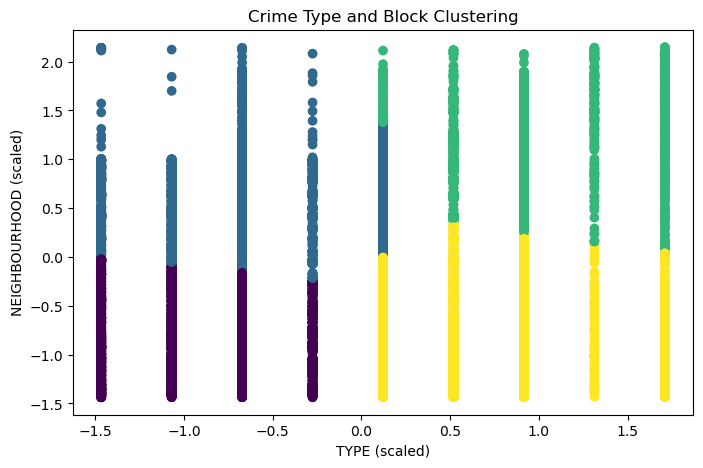

In [25]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 4)
X_sample2['Cluster'] = kmeans.fit_predict(X_scaled2)

plt.figure(figsize=(20, 20), dpi=80)

# Visualize clusters (assuming two features after one-hot encoding)
plt.figure(figsize=(8, 5))
plt.scatter(X_scaled2[:, 0], X_scaled2[:, 1], c=X_sample2['Cluster'])  # Assuming first two features
plt.title("Crime Type and Block Clustering")
plt.xlabel('TYPE (scaled)')   #X_scaled2 is scaled data
plt.ylabel('NEIGHBOURHOOD (scaled)')
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Fung Ke Yun\AppData\Local\Temp\ipykernel_24024\3860119665.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_sample2['Cluster'] = km_cluster_labels2


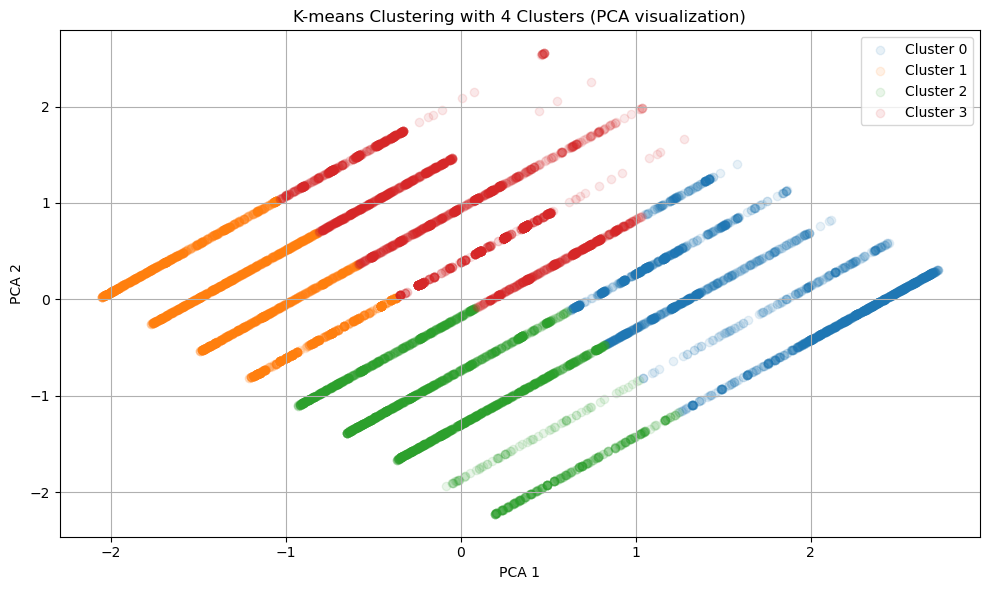

In [26]:
# Cluster the data into 3 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
km_cluster_labels2 = kmeans.fit_predict(X_scaled2)
X_sample2['Cluster'] = km_cluster_labels2

# Plot the clusters
plt.figure(figsize=(10, 6))
for cluster_num in range(4):
    subset = X_principal2[X_sample2['Cluster'] == cluster_num]
    plt.scatter(subset[:, 0], subset[:, 1], label=f"Cluster {cluster_num}", alpha=0.1)

plt.title('K-means Clustering with 4 Clusters (PCA visualization)')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### K-means evaluate performance

In [27]:
# Calculate the Silhouette Score on the test set
print(km_cluster_labels1)
print(km_cluster_labels2)

km_silhouette_score = silhouette_score(X_sample1, km_cluster_labels1)
print(f"Silhouette Score of X_sample1 on K-means: {km_silhouette_score:.3f}")
km_silhouette_score2 = silhouette_score(X_sample2, km_cluster_labels2)
print(f"Silhouette Score of X_sample2 on K-means: {km_silhouette_score:.3f}")

[1 2 0 ... 2 2 1]
[1 3 3 ... 0 0 0]
Silhouette Score of X_sample1 on K-means: 0.968
Silhouette Score of X_sample2 on K-means: 0.968


### K-menas with MarkerCluster

# DBscan

In [28]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
 
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(X_principal1)
distances, indices = neighbors_fit.kneighbors(X_principal1)

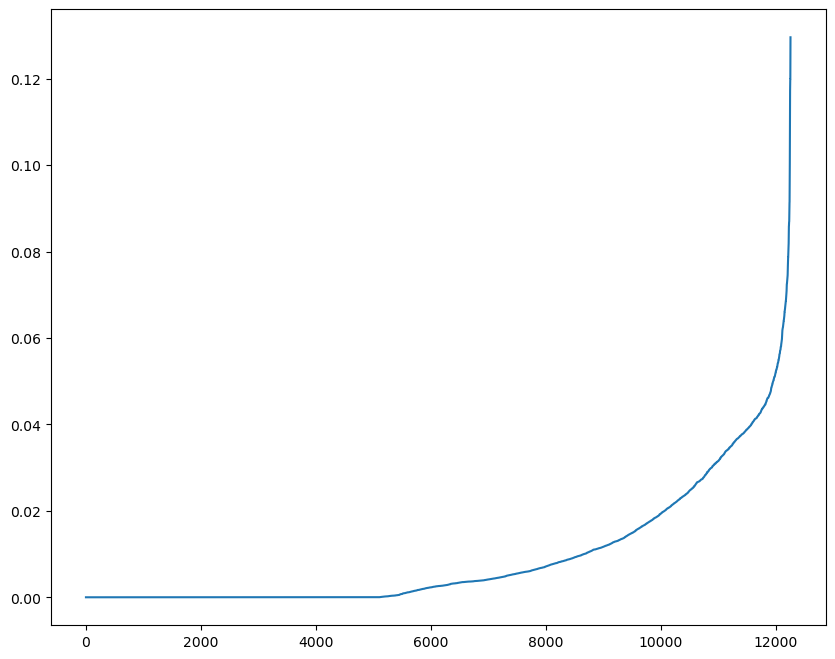

In [29]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(10, 8))
plt.plot(distances)

Lets consider eps range 0.05 to 0.013 and _min_sample_ range 10 to 15 and iterate over these combinations and get the best silhouette score.

In [30]:
min_samples = range(10,15)
eps = np.arange(0.05, 0.13, 0.01)


In [31]:
from sklearn.metrics import silhouette_score

output = []

for ms in min_samples:
    for ep in eps:
        db_labels = DBSCAN(min_samples=ms, eps = ep).fit(X_principal1).labels_
        db_score = silhouette_score(X_scaled1, db_labels)
        output.append((ms, ep, db_score))

In [32]:
min_samples, eps, db_score = sorted(output, key=lambda x:x[-1])[-1]
print(f"Best silhouette_score: {db_score}")
print(f"min_samples: {min_samples}")
print(f"eps: {eps}")

Best silhouette_score: -0.1804149009694409
min_samples: 13
eps: 0.08000000000000002


Get the parameters for best silhouette score

In [33]:
# Applying DBSCAN
#eps = 0.11000000000000001 # Adjust as needed
eps = 0.12000000000000001
min_samples = 14  # Adjust as needed
dbscan_cluster_model = DBSCAN(eps=eps, min_samples=min_samples).fit(X_principal1)

# Getting cluster labels
db_cluster_labels = dbscan_cluster_model.labels_

# create another datafrome for dbscan
df_dbs = X_sample1

# Add cluster labels to the DataFrame
df_dbs['Cluster'] = db_cluster_labels

# Check the number of clusters and points classified as noise
db_num_clusters = len(set(db_cluster_labels)) - (1 if -1 in db_cluster_labels else 0)
num_noise_points = list(db_cluster_labels).count(-1)

print(f"Number of clusters: {db_num_clusters}")
print(f"Number of points classified as noise: {num_noise_points}")

Number of clusters: 14
Number of points classified as noise: 308


C:\Users\Fung Ke Yun\AppData\Local\Temp\ipykernel_24024\2803736293.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dbs['Cluster'] = db_cluster_labels


In [34]:
import plotly.express as px

fig = px.scatter(x=df_dbs.Longitude, y=df_dbs.Latitude, color=df_dbs['Cluster'])

fig.show()

In [35]:
import folium
import plotly.express as px

# Create a map centered around the mean latitude and longitude of the data
m = folium.Map(location=[df_dbs['Latitude'].mean(), df_dbs['Longitude'].mean()], zoom_start=10, control_scale=True, prefer_canvas=True)

# Define a color palette for clusters
color_palette = px.colors.qualitative.Set1

# Add markers for each data point with color based on cluster
for index, row in df_dbs.iterrows():
    cluster_label = int(row['Cluster'])  # Convert cluster label to integer
    cluster_color = color_palette[cluster_label % len(color_palette)]
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']], radius=3, color=cluster_color, fill=True, fill_color=cluster_color).add_to(m)

# Convert Plotly Express scatter plot to HTML
fig = px.scatter_mapbox(df_dbs, lat="Latitude", lon="Longitude", color="Cluster", zoom=10).to_html()

# Add Plotly Express scatter plot HTML to Folium map
folium.Html(fig, script=True).add_to(m)

# Display the map
m



In [36]:
dbs_silhouette_avg = silhouette_score(X_sample1, db_cluster_labels)
dbs_silhouette_avg

0.9501129181232032

From DBSCAN we got to know the number of clusters present, which are 15, with silhouette score of 0.954 which is above 0.5, it is indicated that data points have good separation between clusters. 

In Silhouette Score the best value is 1 and the worst value is -1.

## Hierarchical Clustering

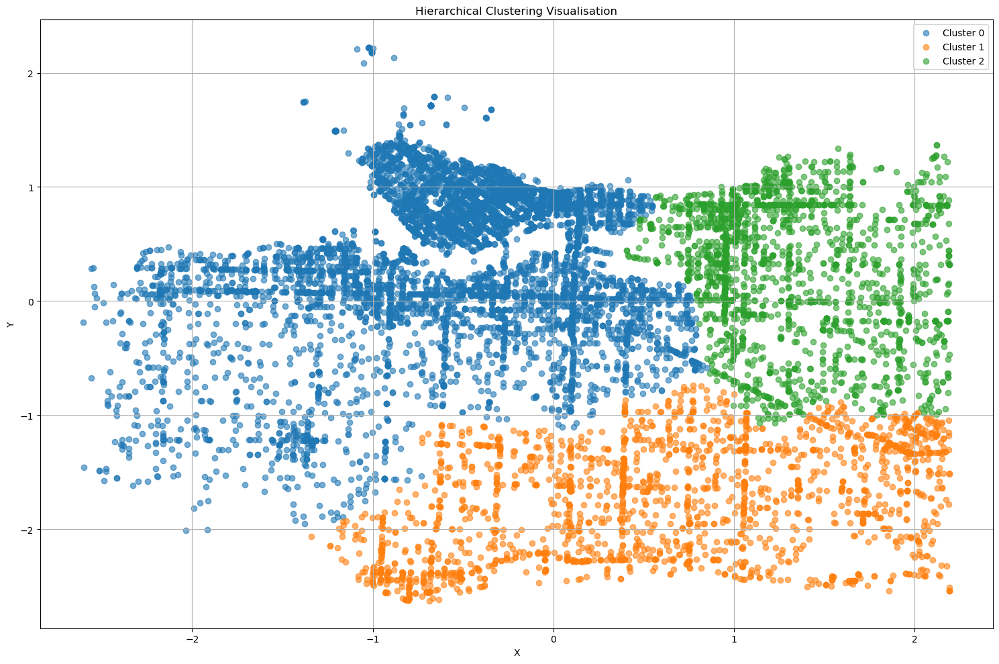

In [37]:
from sklearn.cluster import AgglomerativeClustering

# Perform hierarchical clustering
# linkage='ward', it defines the linkage method for merging clusters
hc_model = AgglomerativeClustering(n_clusters=3, linkage='ward')  
# fit model and predict the cluster labels for each data point
hc_cluster_labels = hc_model.fit_predict(X_scaled1)

# 15 inches wide and 10 inches high
plt.figure(figsize =(15, 10))

for cluster_num in range(hc_model.n_clusters):  # Use n_clusters from the model
    subset = X_scaled1[hc_cluster_labels == cluster_num]  # Use cluster labels to filter the scaled data
    # Plots the data points in the current cluster with appropriate labels and transparency.
    plt.scatter(subset[:, 0], subset[:, 1], label=f"Cluster {cluster_num}", alpha=0.6)
    
plt.title('Hierarchical Clustering Visualisation')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend() # Place a legend on the axis
plt.grid(True) # configure grid lines
plt.tight_layout() # auto adjust subplot and fits into figure area
plt.show()

In [38]:
# calculates the Silhouette Coefficient score and stores it into silhouette_avg 
hc_silhouette_avg = silhouette_score(X_sample1, hc_cluster_labels)
hc_silhouette_avg

-0.34414332206029075

# Mean Shift Clustering

In [39]:
from sklearn.cluster import MeanShift, estimate_bandwidth

Number of clusters 1: 5
Number of clusters 2: 1


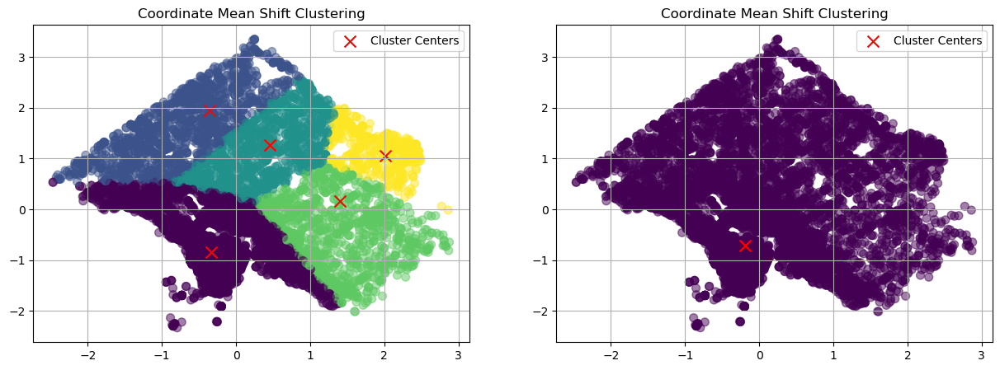

In [40]:
# Using X_principal1 with different bandwidth

# Initialize MeanShift clustering with bandwidth (radius for density estimation)
bandwidth1 = estimate_bandwidth(X_principal1, quantile=0.1) 
mean_shift1 = MeanShift(bandwidth=bandwidth1)
bandwidth2 = estimate_bandwidth(X_principal1, quantile=0.2) 
mean_shift2 = MeanShift(bandwidth=bandwidth2)

# Fit the model to the data
ms_model1 = mean_shift1.fit(X_principal1)
ms_model2 = mean_shift2.fit(X_principal1)

# Retrieve the cluster centers
# from model1
ms_labels1 = ms_model1.labels_
ms_cluster_centers1 = ms_model1.cluster_centers_
ms_num_clusters1 = len(ms_cluster_centers1)
#from model2
ms_labels2 = ms_model2.labels_
ms_cluster_centers2 = ms_model2.cluster_centers_
ms_num_clusters2 = len(ms_cluster_centers2)

print("Number of clusters 1:", ms_num_clusters1)
print("Number of clusters 2:", ms_num_clusters2)

# Visualizing the clusters
plt.subplots(1, 2, figsize=(15, 5))

ax=plt.subplot(1,2,1)
plt.scatter(X_principal1[:, 1], X_principal1[:, 0], c=ms_labels1, cmap='viridis', s=50, alpha=0.5)
plt.scatter(ms_cluster_centers1[:, 1], ms_cluster_centers1[:, 0], marker='x', c='red', s=100, label='Cluster Centers')
plt.title('Coordinate Mean Shift Clustering')
plt.legend()
plt.grid(True)

ax=plt.subplot(1,2,2)
plt.scatter(X_principal1[:, 1], X_principal1[:, 0], c=ms_labels2, cmap='viridis', s=50, alpha=0.5)
plt.scatter(ms_cluster_centers2[:, 1], ms_cluster_centers2[:, 0], marker='x', c='red', s=100, label='Cluster Centers')
plt.title('Coordinate Mean Shift Clustering')
plt.legend()
plt.grid(True)

Number of clusters 3: 13
Number of clusters 4: 4


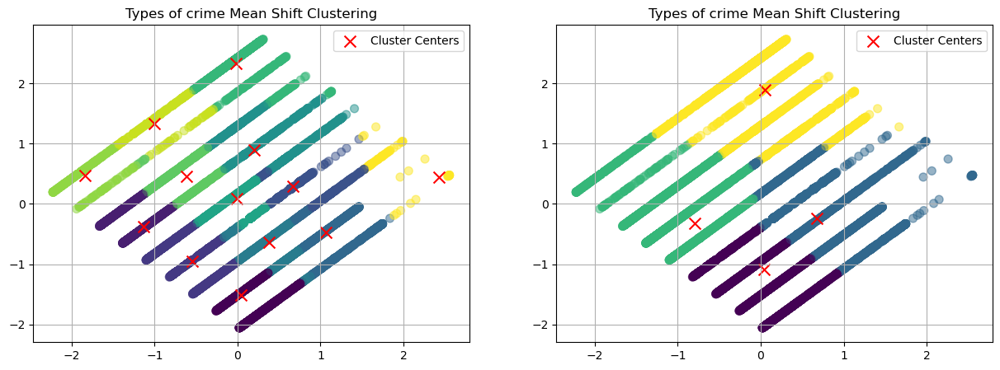

In [41]:
# Using X_principal2 with different bandwidth

# Initialize MeanShift clustering with bandwidth (radius for density estimation)
bandwidth3 = estimate_bandwidth(X_principal2, quantile=0.1) 
mean_shift3 = MeanShift(bandwidth=bandwidth3)
bandwidth4 = estimate_bandwidth(X_principal2, quantile=0.2) 
mean_shift4 = MeanShift(bandwidth=bandwidth4)

# Fit the model to the data
ms_model3 = mean_shift3.fit(X_principal2)
ms_model4 = mean_shift4.fit(X_principal2)

# Retrieve the cluster centers
# from model1
ms_labels3 = ms_model3.labels_
ms_cluster_centers3 = ms_model3.cluster_centers_
ms_num_clusters3 = len(ms_cluster_centers3)
#from model2
ms_labels4 = ms_model4.labels_
ms_cluster_centers4 = ms_model4.cluster_centers_
ms_num_clusters4 = len(ms_cluster_centers4)

print("Number of clusters 3:", ms_num_clusters3)
print("Number of clusters 4:", ms_num_clusters4)

# Visualizing the clusters
plt.subplots(1, 2, figsize=(15, 5))

ax=plt.subplot(1,2,1)
plt.scatter(X_principal2[:, 1], X_principal2[:, 0], c=ms_labels3, cmap='viridis', s=50, alpha=0.5)
plt.scatter(ms_cluster_centers3[:, 1], ms_cluster_centers3[:, 0], marker='x', c='red', s=100, label='Cluster Centers')
plt.title('Types of crime Mean Shift Clustering')
plt.legend()
plt.grid(True)

ax=plt.subplot(1,2,2)
plt.scatter(X_principal2[:, 1], X_principal2[:, 0], c=ms_labels4, cmap='viridis', s=50, alpha=0.5)
plt.scatter(ms_cluster_centers4[:, 1], ms_cluster_centers4[:, 0], marker='x', c='red', s=100, label='Cluster Centers')
plt.title('Types of crime Mean Shift Clustering')
plt.legend()
plt.grid(True)

### Mean Shift evaluation performance

In [42]:
# Using X_sample1

ms_silhouette_avg1 = silhouette_score(X_sample1, ms_labels1)
print(f"Silhouette average on Coordinates Mean Shift Clustering with quantile value 0.1 : %0.3f" % ms_silhouette_avg1)

# ms_silhouette_avg2 = silhouette_score(X_sample1, ms_labels2)
print(f"Silhouette average on Coordinates Mean Shift Clustering with quantile value 0.2 : \nDue to the result in cluster 2 have only one cluster label, it would not take to calculate in silhouette score")

Silhouette average on Coordinates Mean Shift Clustering with quantile value 0.1 : -0.402
Silhouette average on Coordinates Mean Shift Clustering with quantile value 0.2 : 
Due to the result in cluster 2 have only one cluster label, it would not take to calculate in silhouette score


In [43]:
# Using X_sample2

ms_silhouette_avg3 = silhouette_score(X_sample2, ms_labels3)
print(f"Silhouette average on Types of crime Mean Shift Clustering with quantile value 0.1 : %0.3f" % ms_silhouette_avg3)

ms_silhouette_avg4 = silhouette_score(X_sample2, ms_labels4)
print(f"Silhouette average on Types of crime Mean Shift Clustering with quantile value 0.1 : %0.3f" % ms_silhouette_avg4)

Silhouette average on Types of crime Mean Shift Clustering with quantile value 0.1 : -0.112
Silhouette average on Types of crime Mean Shift Clustering with quantile value 0.1 : 0.132


# Spectral Clustering

With X_sample1, x_principal1

In [44]:
from sklearn.cluster import SpectralClustering 

# Building the clustering model 
spectral_model_rbf1 = SpectralClustering(n_clusters = 2, affinity ='rbf') 
spectral_model_nn1 = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors')

# Training the model and Storing the predicted cluster labels 
labels_rbf1 = spectral_model_rbf1.fit_predict(X_principal1)
labels_nn1 = spectral_model_nn1.fit_predict(X_principal1)

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



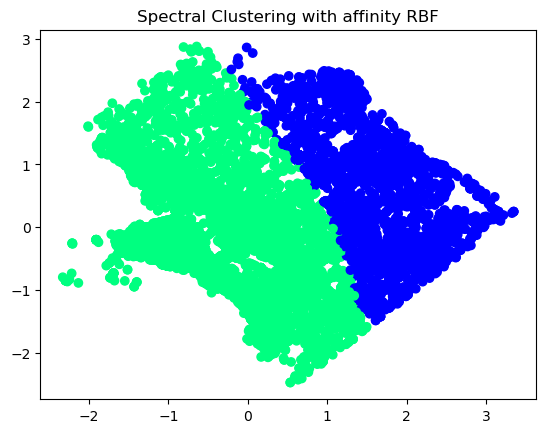

In [45]:
# Visualizing the clustering 
plt.scatter(df_X_principal1['P1'], df_X_principal1['P2'],  
           c = SpectralClustering(n_clusters = 2, affinity ='rbf') .fit_predict(X_principal1), cmap =plt.cm.winter)
plt.title("Spectral Clustering with affinity RBF")
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



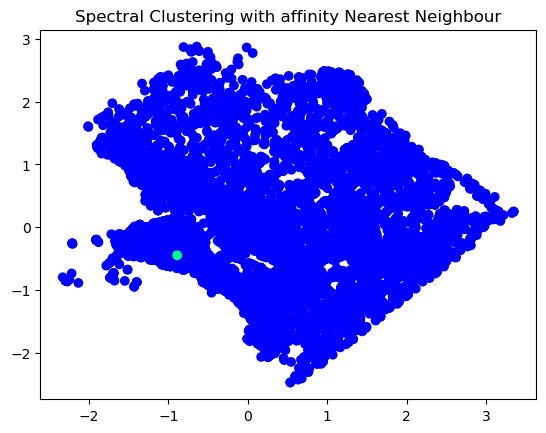

In [46]:
plt.scatter(df_X_principal1['P1'], df_X_principal1['P2'],  
           c = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors') .fit_predict(X_principal1), cmap =plt.cm.winter) 
plt.title("Spectral Clustering with affinity Nearest Neighbour")
plt.show()

With X_sample2, X_principal2

In [47]:
# Building the clustering model 
spectral_model_rbf2 = SpectralClustering(n_clusters = 2, affinity ='rbf') 
spectral_model_nn2 = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors')

# Training the model and Storing the predicted cluster labels 
labels_rbf2 = spectral_model_rbf2.fit_predict(X_principal2)
labels_nn2 = spectral_model_nn2.fit_predict(X_principal2)

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



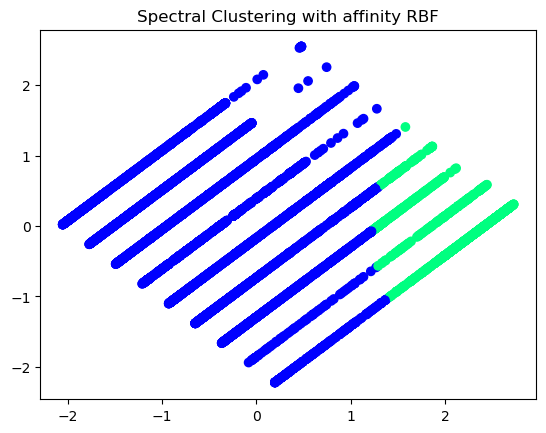

In [48]:
# Visualizing the clustering 
plt.scatter(df_X_principal2['P1'], df_X_principal2['P2'],  
           c = SpectralClustering(n_clusters = 2, affinity ='rbf') .fit_predict(X_principal2), cmap =plt.cm.winter)
plt.title("Spectral Clustering with affinity RBF")
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



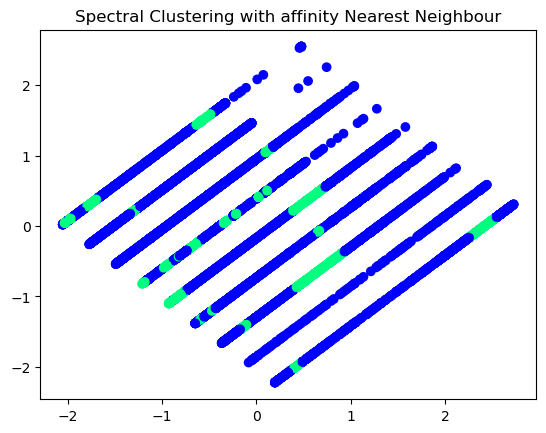

In [49]:
plt.scatter(df_X_principal2['P1'], df_X_principal2['P2'],  
           c = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors') .fit_predict(X_principal2), cmap =plt.cm.winter) 
plt.title("Spectral Clustering with affinity Nearest Neighbour")
plt.show()

### Spectral Clustering evaluation performance

In [50]:
import matplotlib.pyplot as plt

# List of different values of affinity
affinity1 = ['rbf', 'nearest-neighbours']
affinity2 = ['rbf', 'nearest-neighbours']

# List of Silhouette Scores
s_scores1 = []
s_scores2 = []

# Evaluating the performance
# with X_sample1
sc_rbf_silhouette_avg1 = silhouette_score(X_sample1, labels_rbf1)
s_scores1.append(sc_rbf_silhouette_avg1)
sc_nn_silhouette_avg1 = silhouette_score(X_sample1, labels_nn1)
s_scores1.append(sc_nn_silhouette_avg1)
# with X_sample2
sc_rbf_silhouette_avg2 = silhouette_score(X_sample2, labels_rbf2)
s_scores2.append(sc_rbf_silhouette_avg1)
sc_nn_silhouette_avg2 = silhouette_score(X_sample2, labels_nn2)
s_scores2.append(sc_nn_silhouette_avg1)

Silhoutte score with coordinates: 
RBF: 0.323
Nearest Neighbour: -0.787


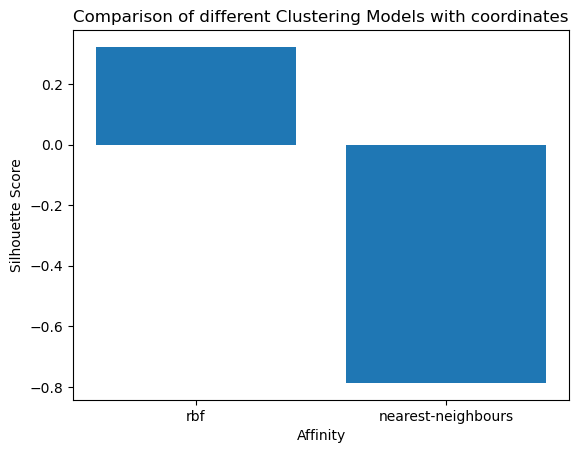

In [51]:
# Plotting a Bar Graph to compare the models
plt.bar(affinity1, s_scores1)
plt.xlabel('Affinity')
plt.ylabel('Silhouette Score')
plt.title('Comparison of different Clustering Models with coordinates')

print("Silhoutte score with coordinates: ")
print(f"RBF: %0.3f" % sc_rbf_silhouette_avg1)
print(f"Nearest Neighbour: %0.3f" % sc_nn_silhouette_avg1)

Silhoutte score with types of crime: 
RBF: 0.373
Nearest Neighbour: 0.024


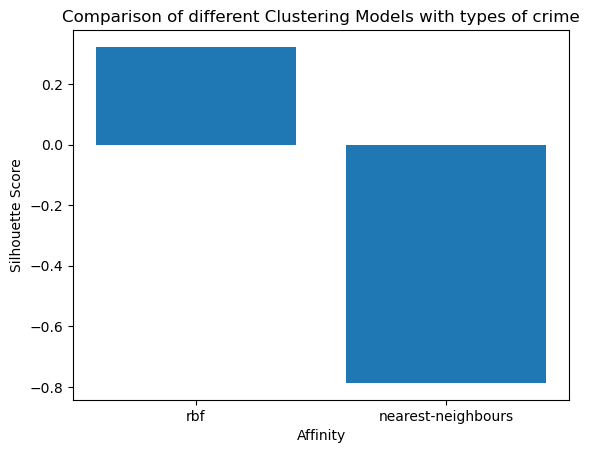

In [52]:
plt.bar(affinity2, s_scores2)
plt.xlabel('Affinity')
plt.ylabel('Silhouette Score')
plt.title('Comparison of different Clustering Models with types of crime')

print("Silhoutte score with types of crime: ")
print(f"RBF: %0.3f" % sc_rbf_silhouette_avg2)
print(f"Nearest Neighbour: %0.3f" % sc_nn_silhouette_avg2)

# Comparison for all model

### Features: Longitude, Latitude

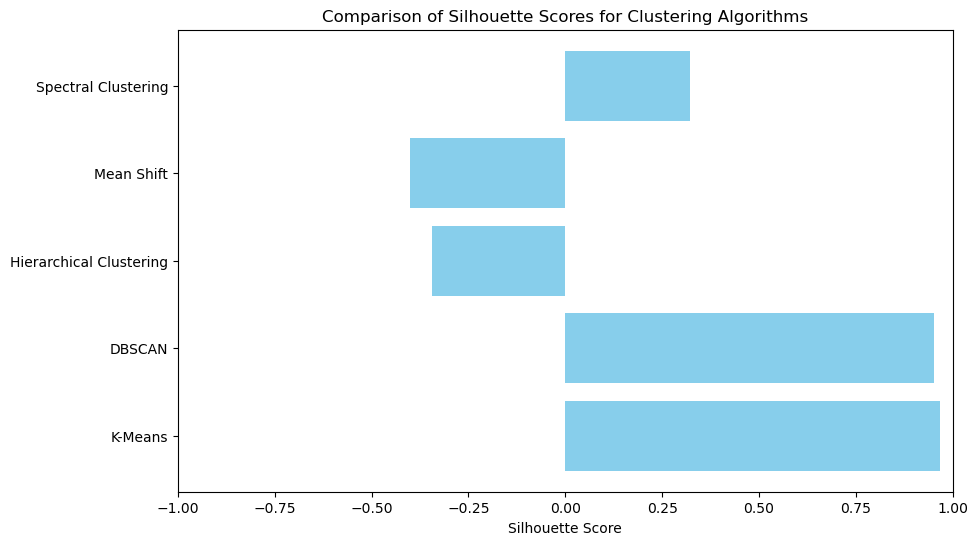

In [55]:
# Define the silhouette scores for each algorithm
silhouette_scores = {
    'Spectral Clustering': sc_rbf_silhouette_avg1,
    'Mean Shift': ms_silhouette_avg1,
    'Hierarchical Clustering': hc_silhouette_avg,
    'DBSCAN': dbs_silhouette_avg,
    'K-Means': km_silhouette_score
}

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.barh(list(silhouette_scores.keys()), list(silhouette_scores.values()), color='skyblue')
plt.xlabel('Silhouette Score')
plt.title('Comparison of Silhouette Scores for Clustering Algorithms')
plt.xlim(-1, 1)  # Set the x-axis limits to -1 to 1, as silhouette score ranges from -1 to 1
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top
plt.show()


# Temporal Analysis using Spectral Analysis

# #Year and Month

In [56]:
from sklearn.preprocessing import LabelEncoder
df_ta = sample_data
df_ta['DATETIME'] = pd.to_datetime(df_ta['DATETIME'])
# Extract 'Month' and 'Year' from 'Date Occurred'
df_ta['YEAR'] = df_ta['DATETIME'].dt.year
df_ta['MONTH'] = df_ta['DATETIME'].dt.month

# Encode 'Crime Description' using LabelEncoder
label_encoder = LabelEncoder()
df_ta['Crime TYPE Encoded'] = label_encoder.fit_transform(df_ta['TYPE'])

# Select features for clustering
X = df_ta[['MONTH', 'YEAR', 'Crime TYPE Encoded']]
X.head()

,MONTH,YEAR,Crime TYPE Encoded
451411,9,2016,0
266018,12,2010,0
193935,5,2007,0
1458,10,2003,0
445653,7,2016,0


C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embe

Best number of clusters based on silhouette score: 2


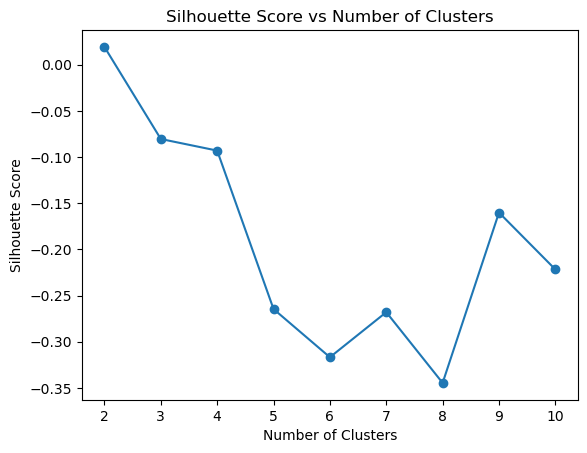

In [57]:
# Range of clusters to try
min_clusters = 2
max_clusters = 10
cluster_range = range(min_clusters, max_clusters + 1)

# Compute silhouette score for each number of clusters
silhouette_scores = []
for n_clusters in cluster_range:
    spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
    cluster_labels = spectral_clustering.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Find the best number of clusters based on silhouette score
best_n_clusters = cluster_range[np.argmax(silhouette_scores)]
print("Best number of clusters based on silhouette score:", best_n_clusters)

# Plot silhouette scores
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Silhouette Score: 0.01926702269707279


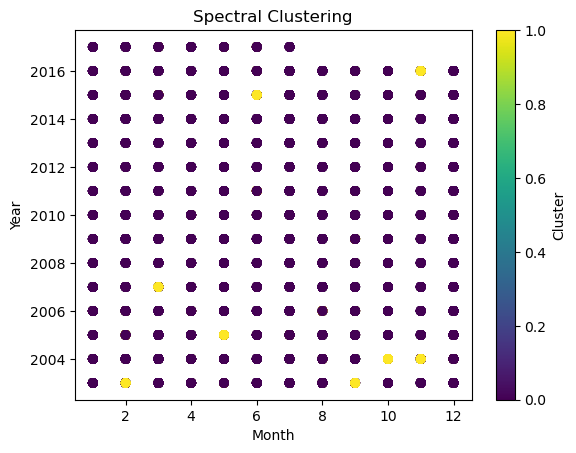

In [58]:
# Perform spectral clustering
spectral_clustering = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(X)

# Evaluate clustering performance using silhouette score
silhouette_avg = silhouette_score(X, cluster_labels)
print("Silhouette Score:", silhouette_avg)

# Visualize the clustering results
plt.scatter(df_ta['MONTH'], df_ta['YEAR'], c=cluster_labels, cmap='viridis')
plt.title("Spectral Clustering")
plt.xlabel("Month")
plt.ylabel("Year")
plt.colorbar(label='Cluster')
plt.show()

In [59]:
df_ta['DAY'] = df_ta['DATETIME'].dt.day
# Combine 'YEAR', 'MONTH', and 'DAY' columns to create a new 'DATE' column
df_ta['DATE'] = pd.to_datetime(df_ta[['YEAR', 'MONTH', 'DAY']])
# Convert the 'DATE' column to day of the week (e.g., Monday=1, Tuesday=2, etc.)
df_ta['DAY_OF_WEEK'] = df_ta['DATE'].dt.dayofweek + 1
df_ta['DAY_OF_WEEK'] = df_ta['DAY_OF_WEEK'] % 7  # Adjust for Sunday to be 0 instead of 7

# Encode 'Crime Description' using LabelEncoder
label_encoder = LabelEncoder()
df_ta['Crime TYPE Encoded'] = label_encoder.fit_transform(df_ta['TYPE'])

# Select features for clustering
X = df_ta[['DAY', 'DAY_OF_WEEK', 'Crime TYPE Encoded']]
X.head()

,DAY,DAY_OF_WEEK,Crime TYPE Encoded
451411,12,1,0
266018,11,6,0
193935,22,2,0
1458,24,5,0
445653,22,5,0


C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embe

Best number of clusters based on silhouette score: 3


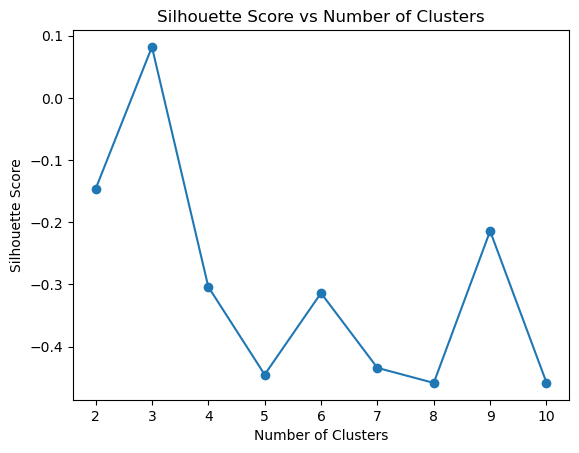

In [60]:
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming X contains your data

# Range of clusters to try
min_clusters = 2
max_clusters = 10
cluster_range = range(min_clusters, max_clusters + 1)

# Compute silhouette score for each number of clusters
silhouette_scores = []
for n_clusters in cluster_range:
    spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
    cluster_labels = spectral_clustering.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Find the best number of clusters based on silhouette score
best_n_clusters = cluster_range[np.argmax(silhouette_scores)]
print("Best number of clusters based on silhouette score:", best_n_clusters)

# Plot silhouette scores
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.show()

C:\Users\Fung Ke Yun\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Silhouette Score: -0.4577237874436304


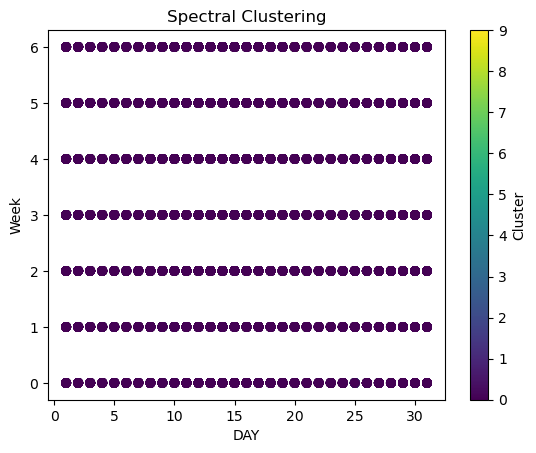

In [61]:
# Perform spectral clustering
spectral_clustering = SpectralClustering(n_clusters=10, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(X)

# Evaluate clustering performance using silhouette score
silhouette_avg = silhouette_score(X, cluster_labels)
print("Silhouette Score:", silhouette_avg)

# Visualize the clustering results
plt.scatter(df_ta['DAY'], df_ta['DAY_OF_WEEK'], c=cluster_labels, cmap='viridis')
plt.title("Spectral Clustering")
plt.xlabel("DAY")
plt.ylabel("Week")
plt.colorbar(label='Cluster')
plt.show()

In [62]:
df_ta['DAY'] = df_ta['DATETIME'].dt.day
df_ta['HOUR'] = df_ta['DATETIME'].dt.hour

# Encode 'Crime Description' using LabelEncoder
label_encoder = LabelEncoder()
df_ta['Crime TYPE Encoded'] = label_encoder.fit_transform(df_ta['TYPE'])

# Select features for clustering
X = df_ta[['HOUR', 'DAY', 'Crime TYPE Encoded']]
X.head()

,HOUR,DAY,Crime TYPE Encoded
451411,17,12,0
266018,12,11,0
193935,9,22,0
1458,17,24,0
445653,15,22,0


Best number of clusters based on silhouette score: 2


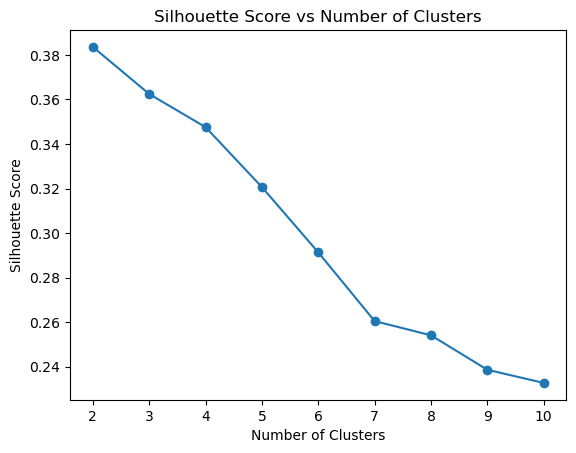

In [63]:
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming X contains your data

# Range of clusters to try
min_clusters = 2
max_clusters = 10
cluster_range = range(min_clusters, max_clusters + 1)

# Compute silhouette score for each number of clusters
silhouette_scores = []
for n_clusters in cluster_range:
    spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
    cluster_labels = spectral_clustering.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Find the best number of clusters based on silhouette score
best_n_clusters = cluster_range[np.argmax(silhouette_scores)]
print("Best number of clusters based on silhouette score:", best_n_clusters)

# Plot silhouette scores
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.show()

Silhouette Score: 0.3836167178631463


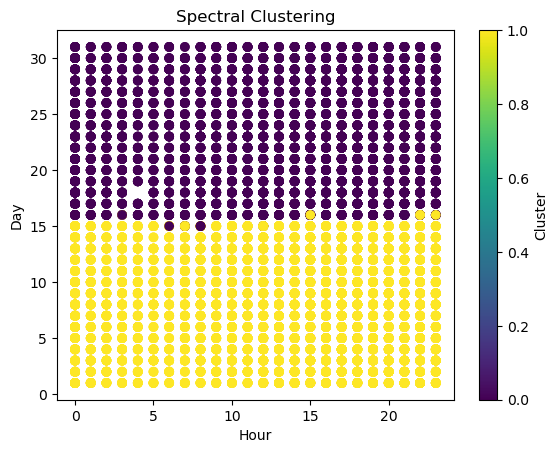

In [64]:
# Perform spectral clustering
spectral_clustering = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(X)

# Evaluate clustering performance using silhouette score
silhouette_avg = silhouette_score(X, cluster_labels)
print("Silhouette Score:", silhouette_avg)

# Visualize the clustering results
plt.scatter(df_ta['HOUR'], df_ta['DAY'], c=cluster_labels, cmap='viridis')
plt.title("Spectral Clustering")
plt.xlabel("Hour")
plt.ylabel("Day")
plt.colorbar(label='Cluster')
plt.show()